In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import albumentations as A
import urllib.request
from PIL import Image

(480, 360)


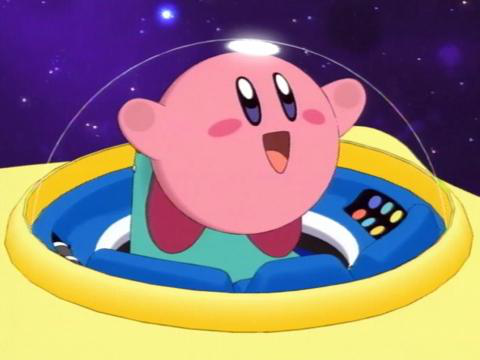

In [ ]:
urllib.request.urlretrieve('https://m.media-amazon.com/images/M/MV5BNTMxMDIyZmUtZjY4Zi00N2VkLTg4M2UtNzc1ODU3NTgyMmUwXkEyXkFqcGdeQXVyNzU1NzE3NTg@._V1_.jpg',"kirby.png")
img = Image.open("kirby.png")
print(img.size)
img

In [ ]:
image = np.array(img)

**Time Comparision**

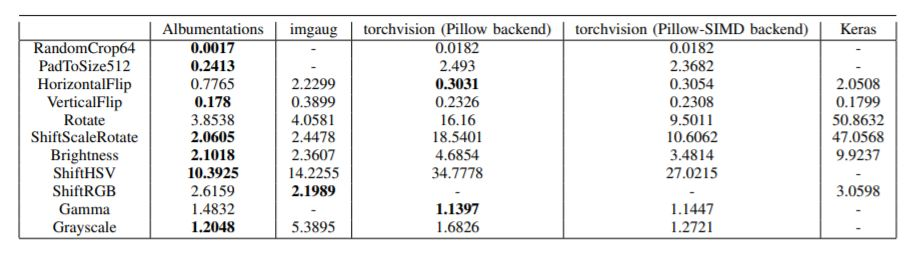

In [ ]:
# skimage
from skimage.io import imshow, imread, imsave
from skimage.transform import rotate, AffineTransform, warp,rescale, resize, downscale_local_mean
from skimage import color,data
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

#OpenCV-Python
import cv2

# imgaug
import imageio
import imgaug as ia
import imgaug.augmenters as iaa

# Albumentations
import albumentations as A

# Augmentor
!pip install augmentor
import Augmentor 

# Keras
from keras.preprocessing.image import ImageDataGenerator,array_to_img, img_to_array, load_img 

In [ ]:
def skimage(image):
  hflipped_image= np.fliplr(image) 
  vflipped_image= np.flipud(image)

def opencv(image):
  img_flip_ud = cv2.flip(image, 0)
  img_flip_lr = cv2.flip(image, 1)

def imgaug(image):
  hflip= iaa.Fliplr(p=1.0)
  hflipped_image2= hflip.augment_image(image)
  vflip= iaa.Flipud(p=1.0) 
  vflipped_image2= vflip.augment_image(image)

def albumentations(image):
  horizontal_flip = A.HorizontalFlip(p=1)
  vertical_flip = A.VerticalFlip(p=1)
  hflip_image = horizontal_flip(image=image)
  vflip_image = vertical_flip(image=image)

# p = Augmentor.Pipeline('/content/kirby.png')
# def augmentor(p):
#   p.flip_left_right(probability=1) 
#   p.flip_top_bottom(probability=1)
#   p.sample(1)

# datagen = ImageDataGenerator(horizontal_flip = True, vertical_flip = True)
# def IDG()

In [ ]:
%timeit -n 1000 -r 5 skimage(image)
%timeit -n 1000 -r 5 opencv(image)
%timeit -n 1000 -r 5 imgaug(image)
%timeit -n 1000 -r 5 albumentations(image)

1000 loops, best of 5: 2.65 µs per loop
1000 loops, best of 5: 474 µs per loop
1000 loops, best of 5: 934 µs per loop
1000 loops, best of 5: 1.05 ms per loop


In [ ]:
def skimage(image):
  # image_bright = adjust_gamma(image, gamma=0.5,gain=1)
  image_dark = adjust_gamma(image, gamma=2,gain=1)
  # noisy_image= random_noise(image)

def opencv(image):
  table = np.array([((i / 255.0) ** 0.5) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
  image=cv2.LUT(image, table)

def imgaug(image):
  # contrast1=iaa.GammaContrast(gamma=0.5)
  # brightened_image = contrast1.augment_image(image)
  contrast2=iaa.GammaContrast(gamma=2)
  darkened_image = contrast2.augment_image(image)

def albumentations(image):
  gamma = A.RandomGamma(p=1)
  img_gamma = gamma(image = image)

# p = Augmentor.Pipeline('/content/kirby.png')
# def augmentor(p):
#   p.flip_left_right(probability=1) 
#   p.flip_top_bottom(probability=1)
#   p.sample(1)

# datagen = ImageDataGenerator(horizontal_flip = True, vertical_flip = True)
# def IDG()

In [ ]:
%timeit -n 1000 -r 5 skimage(image)
%timeit -n 1000 -r 5 opencv(image)
%timeit -n 1000 -r 5 imgaug(image)
%timeit -n 1000 -r 5 albumentations(image)

1000 loops, best of 5: 2.35 ms per loop
1000 loops, best of 5: 1.17 ms per loop
1000 loops, best of 5: 1.46 ms per loop
1000 loops, best of 5: 1.2 ms per loop


**Main transforms**

Text(0.5, 1.0, 'Vertical flip')

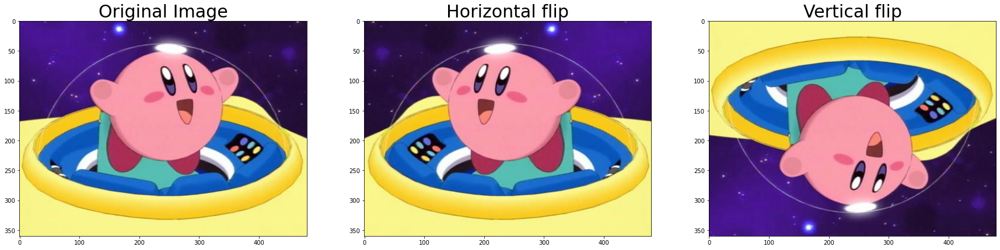

In [ ]:
horizontal_flip = A.HorizontalFlip(p=1)
vertical_flip = A.VerticalFlip(p=1)
hflip_image = horizontal_flip(image = image)
vflip_image = vertical_flip(image = image)

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(hflip_image['image'])
ax[1].set_title("Horizontal flip", size=30)
ax[2].imshow(vflip_image['image'])
ax[2].set_title("Vertical flip", size=30)

Text(0.5, 1.0, 'Flip')

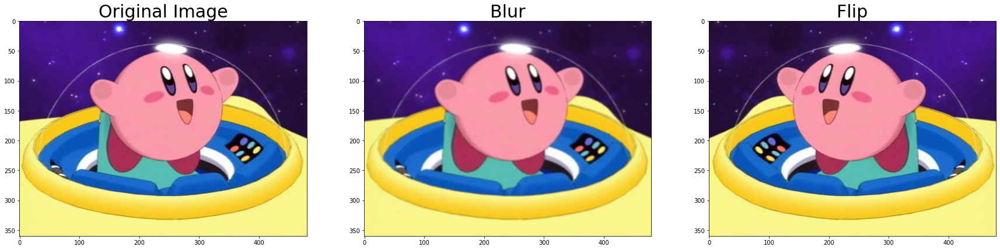

In [ ]:
blur = A.Blur(p=1)
flip = A.Flip(p=1) #horizontal or vertical
blur_image = blur(image = image)
flip_image = flip(image = image)

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(blur_image['image'])
ax[1].set_title("Blur", size=30)
ax[2].imshow(flip_image['image'])
ax[2].set_title("Flip", size=30)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Imagenet Normalize')

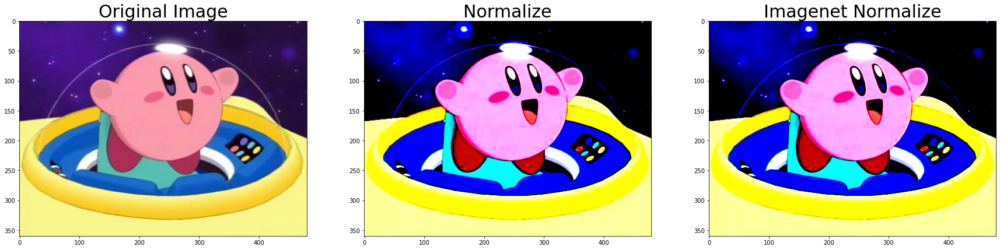

In [ ]:
normalize = A.Normalize(p=1) #defulat mean/std imagenet value
norm_imagenet = A.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225], p=1)
norm_image = normalize(image = image)
normimgnet_image = norm_imagenet(image = image)

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(norm_image['image'])
ax[1].set_title("Normalize", size=30)
ax[2].imshow(normimgnet_image['image'])
ax[2].set_title("Imagenet Normalize", size=30)

Text(0.5, 1.0, 'Random crop')

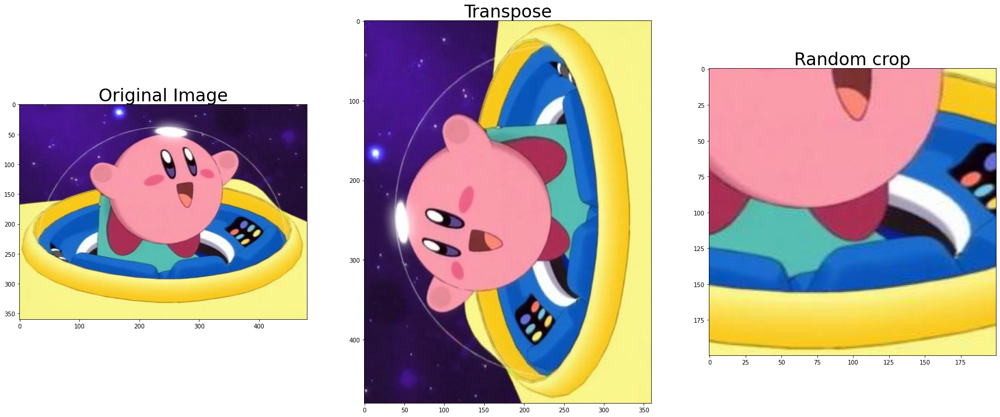

In [ ]:
transpose = A.Transpose(p=1)
randcrop = A.RandomCrop(height=200, width=200, p=1)
trans_image = transpose(image = image)
rcrop_image = randcrop(image = image)

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(trans_image['image'])
ax[1].set_title("Transpose", size=30)
ax[2].imshow(rcrop_image['image'])
ax[2].set_title("Random crop", size=30)

Text(0.5, 1.0, 'Random rotation')

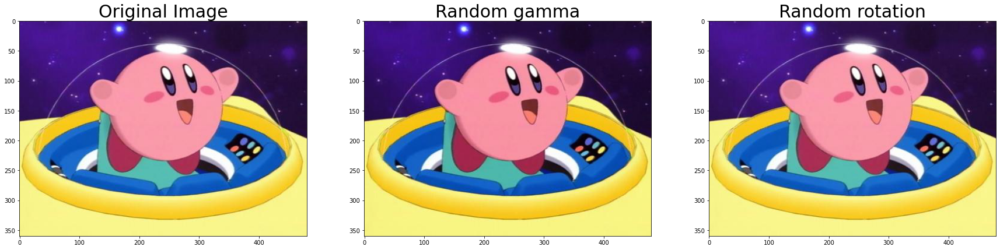

In [ ]:
randgamma = A.RandomGamma(p=1)
randrot90 = A.RandomRotate90(p=1)
rgamma_image = randgamma(image = image)
rrot90_image = randrot90(image = image) # Randomly rotate the input by 90 degrees zero or more time

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(rgamma_image['image'])
ax[1].set_title("Random gamma", size=30)
ax[2].imshow(rrot90_image['image'])
ax[2].set_title("Random rotation", size=30)

Text(0.5, 1.0, 'Shift Scale Rotate')

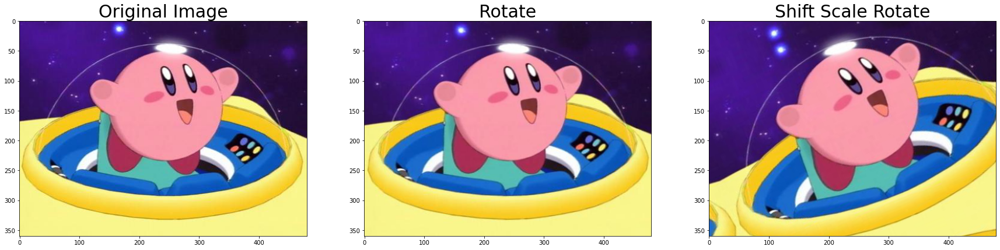

In [ ]:
rotate = A.Rotate(limit=30, p=1)
ssrotate = A.ShiftScaleRotate(p=1)
rot_image = rotate(image = image)
ssrot_image = ssrotate(image = image) # Randomly apply affine transforms: translate, scale and rotate the input.

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(rot_image['image'])
ax[1].set_title("Rotate", size=30)
ax[2].imshow(ssrot_image['image'])
ax[2].set_title("Shift Scale Rotate", size=30)

Text(0.5, 1.0, 'Hue/Saturation change')

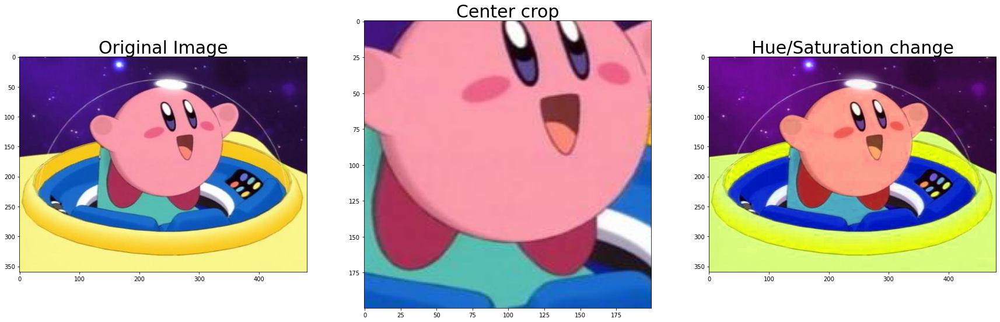

In [ ]:
ccrop = A.CenterCrop(200, 200, p=1)
hsval = A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1)
ccrop_image = ccrop(image = image)
hsval_image = hsval(image = image) 

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(ccrop_image['image'])
ax[1].set_title("Center crop", size=30)
ax[2].imshow(hsval_image['image'])
ax[2].set_title("Hue/Saturation change", size=30)

Text(0.5, 1.0, 'RGBShift')

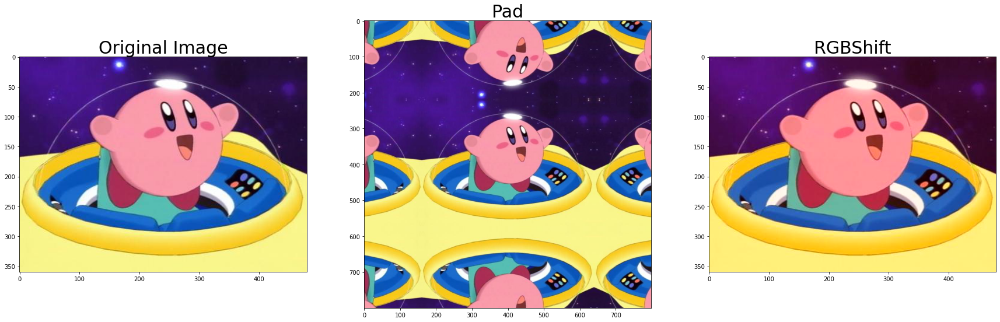

In [ ]:
pad = A.PadIfNeeded(800, 800, p=1)
rgbshift = A.RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20,p=1)
pad_image = pad(image = image)
rgbshift_image = rgbshift(image = image) 

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(pad_image['image'])
ax[1].set_title("Pad", size=30)
ax[2].imshow(rgbshift_image['image'])
ax[2].set_title("RGBShift", size=30)

Text(0.5, 1.0, 'Random contrast')

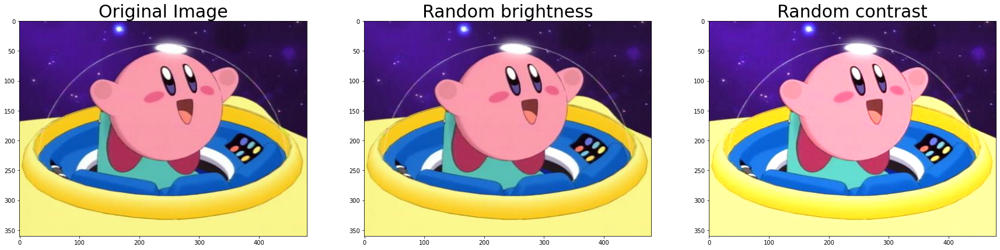

In [ ]:
rbright = A.RandomBrightness(limit=0.2, p=1)
rcontrast = A.RandomContrast(limit=0.2, p=1)
rbright_image = rbright(image = image)
rcontrast_image = rcontrast(image = image) 

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(rbright_image['image'])
ax[1].set_title("Random brightness", size=30)
ax[2].imshow(rcontrast_image['image'])
ax[2].set_title("Random contrast", size=30)

Text(0.5, 1.0, 'CLAHE')

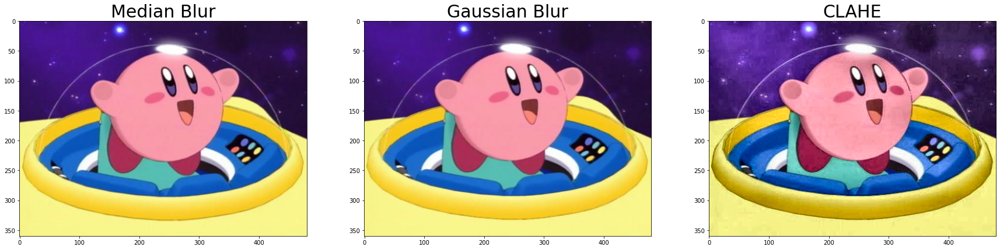

In [ ]:
moblur = A.MotionBlur(p=1)
meblur = A.MedianBlur(blur_limit=7, p=1)
cblur = A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=1) # Contrast Limited Adaptive Histogram Equalization
moblur_image = moblur(image = image)
meblur_image = meblur(image = image)
cblur_image = cblur(image = image)

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(moblur_image['image'])
ax[0].set_title("Median Blur", size=30)
ax[1].imshow(meblur_image['image'])
ax[1].set_title("Gaussian Blur", size=30)
ax[2].imshow(cblur_image['image'])
ax[2].set_title("CLAHE", size=30)

Text(0.5, 1.0, 'Crop')

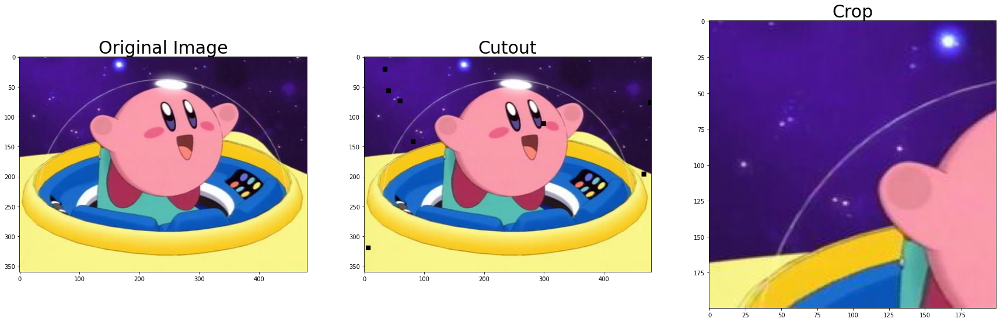

In [ ]:
cutout = A.Cutout(num_holes=8, max_h_size=8, max_w_size=8, p=1)
crop = A.Crop(x_max=200, y_max=200,p=1)
cutout_image = cutout(image = image)
crop_image = crop(image = image) 

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(cutout_image['image'])
ax[1].set_title("Cutout", size=30)
ax[2].imshow(crop_image['image'])
ax[2].set_title("Crop", size=30)

Text(0.5, 1.0, 'Random brightness/contrast change')

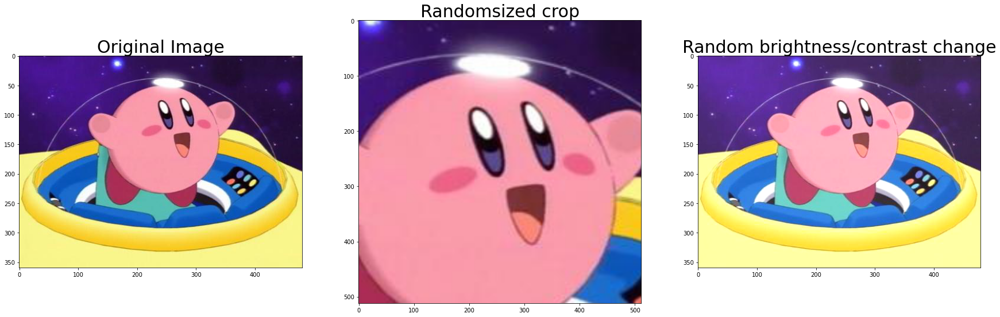

In [ ]:
rscrop = A.RandomSizedCrop(min_max_height=(200, 200), height=512, width=512, p=1)
rbc = A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1)
rscrop_image = rscrop(image = image)
rbc_image = rbc(image = image) 

fig,ax = plt.subplots(1,3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(rscrop_image['image'])
ax[1].set_title("Randomsized crop", size=30)
ax[2].imshow(rbc_image['image'])
ax[2].set_title("Random brightness/contrast change", size=30)

**1.0.0 update**

* imgaug dependency optional
* ToTensor deprecated, use ToTensorV2 

Text(0.5, 1.0, 'Random brightness/contrast change')

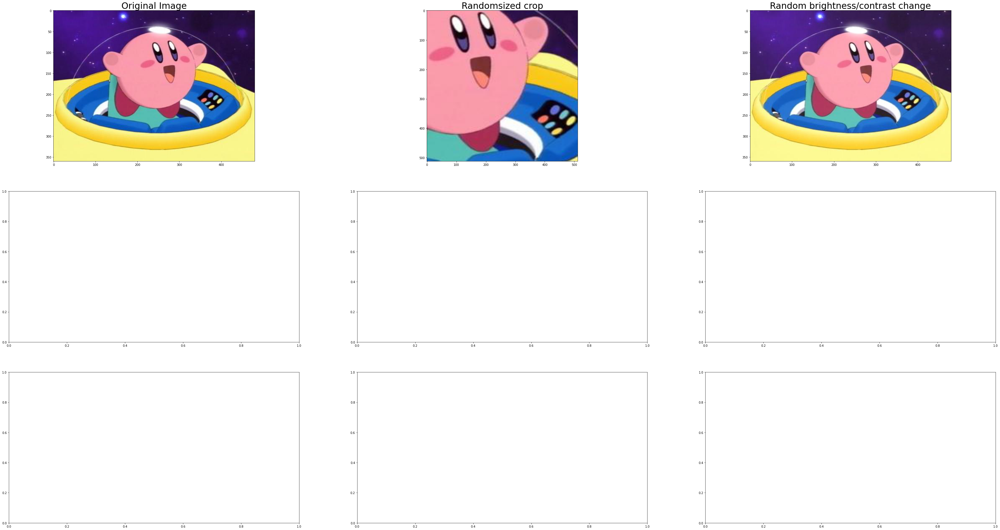

In [ ]:
rscrop = A.CropAndPad(px=None, percent=None, pad_mode=0, pad_cval=0, pad_cval_mask=0, p=1.0)
rbc = A.Emboss(alpha=(0.2, 0.5), strength=(0.2, 0.7), p=1)
sharpen = A.Sharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=1)

rscrop_image = rscrop(image = image)
rbc_image = rbc(image = image) 

fig,ax = plt.subplots(3,3,figsize=(30,16))
ax[0][0].imshow(image)
ax[0][0].set_title("Original Image", size=30)
ax[0][1].imshow(rscrop_image['image'])
ax[0][1].set_title("Randomsized crop", size=30)
ax[0][2].imshow(rbc_image['image'])
ax[0][2].set_title("Random brightness/contrast change", size=30)